# Model situation 1
## Goal:
We want to model a simple market with one normal, one conservative and on risk taking bank, which have different scoring functions and score dependent interest rates. Our aim is to observe the mean score change of borrowers in multiple time steps depending on the institution they choose to borrow from. The decision is based on the borrowers utility, combined with selection rate set by banks based on their utility under different policies. 


# Imports

In [10]:
%load_ext autoreload
%autoreload 2
%pylab inline
import numpy as np
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt

import seaborn as sns

# import all of our files
import sys
sys.path.append('../')

import fico
import distribution_to_loans_outcomes as dlo
import support_functions as sf

DATA_DIR = '../data/'

# set plotting parameters
sns.set_context("talk")
sns.set_style("white")

# this needs to be here so we can edit figures later
plt.rcParams['pdf.fonttype'] = 42

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Populating the interactive namespace from numpy and matplotlib


/home/michal/.local/lib/python3.5/site-packages/IPython/core/magics/pylab.py:161: UserWarning: pylab import has clobbered these variables: ['step']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"
/home/michal/anaconda3/envs/py35/lib/python3.5/site-packages/matplotlib/__init__.py:1405: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


# Variable definition

In [20]:
debug = False
time_steps = 100
step = 0

#general market setting
reference_bank_name = "reference"
bank_names = ["conservative", "risk taking"]
bank_line_style = ['--', ':']
N_banks = len(bank_names)

#score distribution shift
score_shifts = [-20, 40]

#bank interest rate setting
score_range = [300,850]
interest_range_conservative_bank = [0.27, 0.04]
interest_range_risk_bank = [0.20, 0.07]
bank_interest_rate_ranges = [interest_range_conservative_bank, interest_range_risk_bank]

# profit and impact
utility_repaid_1 = 1
utility_default_1 = -4
utility_repaid_2 = 1
utility_default_2 = -10

# considering several utility ratios to understand sensitivity of qualitative results
util_repay = [[utility_default_1,utility_repaid_1], [utility_default_2,utility_repaid_2]]
util_repay_selecter = 0

score_change_repay = 75
score_change_default = -150

impact = [score_change_default,score_change_repay]

#policy colors, MU, DP, EO
policy_names = ["Max. utility", "Dem. parity", "Equal opportunity" ]
policy_colors = ['green', 'blue', 'red']
N_policy = len(policy_names)

#cdf groups
group_names = ["White","Black"]
group_colors = ['grey', 'black']
N_groups = len(group_names)

# 0.1 Load  data and create customers according to FICO distribution

In [21]:
all_cdfs, performance, totals = fico.get_FICO_data(data_dir=DATA_DIR);
cdfs = all_cdfs[group_names]
cdf_groups = np.transpose(cdfs.values)

scores = cdfs.index
scores_list = scores.tolist()
scores_repay = cdfs.index

repays = performance[group_names]

# to get loan repay probabilities for a given score
loan_repaid_probs = [lambda i: repays[group_names[0]][scores[scores.get_loc(i,method='nearest')]], 
                     lambda i: repays[group_names[1]][scores[scores.get_loc(i,method='nearest')]]]

totals = fico.read_totals(data_dir=DATA_DIR)
##### comment to use dataset totals
totals['White']=8800
totals['Black']=1200
####
group_totals = np.zeros(len(group_names), dtype=np.int32)
for i in range(0,len(group_names)):
    group_totals[i] = int(totals[group_names[i]])

pis = np.zeros(cdf_groups.shape)
customer_totals = np.zeros(len(group_names), dtype=np.int32)

for i in range(0, len(group_names)): 
    pis[i] = sf.get_pmf(cdf_groups[i])
    customer_totals[i] = np.sum(np.round(pis[i]*group_totals[i]))
print("Reference group totals: " + str(group_totals))
print("Calculated group totals: " + str(customer_totals))
# demographic statistics 
group_ratio = np.array((customer_totals[0], customer_totals[1]))
group_size_ratio = group_ratio/group_ratio.sum()
print("Group size ratio: " + str(group_size_ratio))

pis_total = np.round(pis*group_totals[:, None])

ref_customer_scores = sf.get_ref_customers(customer_totals, pis_total, scores_list)

if debug:
    for i in range(0,len(pis)):
        plt.figure(i)
        plt.plot(scores,pis[i])
        plt.hist(ref_customer_scores[i],50, normed=True)
        plt.ylabel('Fraction/Occurence')
        plt.xlabel('Score')
        plt.title('Fraction and computed customer histogram for '+ group_names[i] + " group.")
        plt.grid()
        plt.legend(loc="upper")
        plt.show()


Reference group totals: [8800 1200]
Calculated group totals: [8805 1193]
Group size ratio: [ 0.88067614  0.11932386]


../fico.py:63: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  cdfs = cleanup_frame(pd.DataFrame.from_csv(data_dir + filenames[0]))
../fico.py:64: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  performance = 100 - cleanup_frame(pd.DataFrame.from_csv(data_dir + filenames[1]))
../fico.py:28: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  frame = cleanup_frame(pd.DataFrame.from_csv(data_dir + FILES['overview']))


# 0.2.1 Visualize interest rates and compute their intersection
# 0.2.2 Visualize customer utility curve

Interest rate intersections: [685.00000000000011, 685.00000000000011]


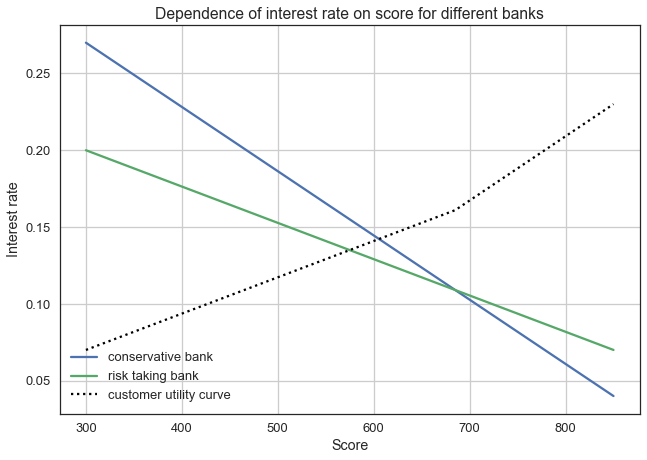

In [22]:
##TODO detect if which intersection is valid
score_interest_intersect = []    
for i in range(0,N_banks): 
    a1= array([score_range[0],bank_interest_rate_ranges[i][0]])
    a2= array([score_range[1],bank_interest_rate_ranges[i][1]])
    
    if i < N_banks-1:
        b1= array([score_range[0],bank_interest_rate_ranges[i+1][0]])
        b2= array([score_range[1],bank_interest_rate_ranges[i+1][1]])
    else:
        b1= array([score_range[0],bank_interest_rate_ranges[0][0]])
        b2= array([score_range[1],bank_interest_rate_ranges[0][1]])
        
    interest_intersect = sf.seg_intersect(a1,a2,b1,b2)
    score_interest_intersect.append(interest_intersect[0])

print("Interest rate intersections: " + str(score_interest_intersect))

#get score mapping to interest rates for different banks
score_interest_rates = sf.get_i_rates(bank_interest_rate_ranges,score_range, bank_names)

# 0.3 Get customer scores and cdfs for different banks

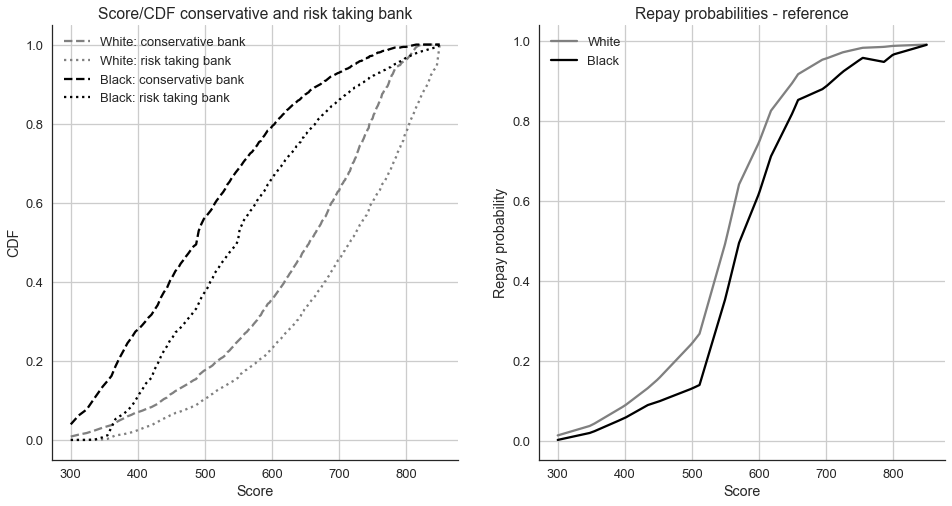

In [23]:
#customers.shape = XxYxZ; X=Groups(white,black), Y=Banks, Z=Individual scores
customer_scores = sf.get_customers(ref_customer_scores, score_shifts, score_range)

#customer_cdfs.shape = XxYxZ, X=Groups, Y=Banks, Z= CDF for score range
customer_cdfs = sf.get_customer_cdfs(customer_scores, scores_list)

#customer_pis.shape = XxYxZ, X=Groups, Y=Banks, Z= distribution value for every score range
customer_pis = sf.get_customer_pis(customer_cdfs)

#combined score have the same form XxYxZ; X=group Y=1 Z=values
customer_combined_scores = sf.get_combined_scores(customer_scores, score_interest_rates, N_banks)
customer_combined_cdfs = sf.get_customer_cdfs(customer_combined_scores, scores_list)
customer_combined_pis = sf.get_customer_pis(customer_combined_cdfs)

fig, ax = plt.subplots(1,2,figsize=(16,8));     
for i in range(N_groups):
    ax[1].plot(scores_list,repays[group_names[i]],color=group_colors[i], label=group_names[i])
    for j in range(N_banks):
        ax[0].plot(scores_list,customer_cdfs[i][j],bank_line_style[j],color=group_colors[i], label=group_names[i] + ': ' + bank_names[j] + ' bank')


ax[0].spines['right'].set_visible(False)
ax[0].spines['top'].set_visible(False)
ax[0].set_title("Score/CDF conservative and risk taking bank")
ax[0].set_xlabel("Score")
ax[0].set_ylabel("CDF")
ax[0].legend()
ax[0].grid()

ax[1].spines['right'].set_visible(False)
ax[1].spines['top'].set_visible(False)
ax[1].set_title("Repay probabilities - reference")
ax[1].set_xlabel("Score")
ax[1].set_ylabel("Repay probability")
ax[1].legend()
ax[1].grid()

# 1.1 Get outcome curves

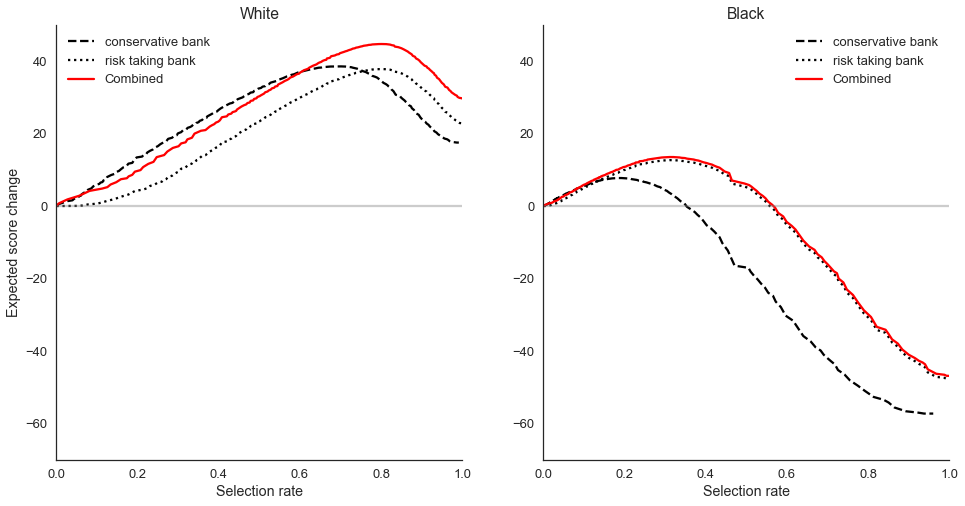

In [24]:
# get outcome curves
customer_outcome_curves = []
customer_combined_outcome_curves = []
customer_rate_index = []
customer_combined_rate_index = []
for i in range(0,len(customer_pis)):
    tmp_curves = []
    tmp_rate_index = []
    customer_combined_rate_index.append([list(reversed(1- customer_combined_cdfs[i][0]))])
    customer_combined_outcome_curves.append([dlo.get_outcome_curve(loan_repaid_probs[i],customer_combined_pis[i][0],scores,impact)])

    for j in range(0, len(customer_pis[i])):
            tmp_curves.append(dlo.get_outcome_curve(loan_repaid_probs[i],customer_pis[i][j],scores,impact))
            tmp_rate_index.append(list(reversed(1- customer_cdfs[i][j])))
    customer_outcome_curves.append(tmp_curves)
    customer_rate_index.append(tmp_rate_index)
                                  
fig, ax = plt.subplots(1,2,figsize=(16,8));                                   
for i in range(0, len(customer_outcome_curves)):
    for j in range(0, len(customer_outcome_curves[i])):
        label = bank_names[j] +" bank"
        ax[i].plot(customer_rate_index[i][j],customer_outcome_curves[i][j],color='black',LineStyle=bank_line_style[j], label= label)
    ax[i].set_title(group_names[i])
    ax[i].plot(customer_combined_rate_index[i][0],customer_combined_outcome_curves[i][0],color='red',LineStyle="-", label= "Combined")
    ax[i].set_xlabel('Selection rate');
    ax[i].set_ylim([-70,50])
    ax[i].set_xlim([0,1])
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)
    ax[i].axhline(0,LineStyle='-', color='grey',alpha=0.4)
    ax[i].legend()

ax[0].set_ylabel('Expected score change')




# 1.2 Get bank utility curves

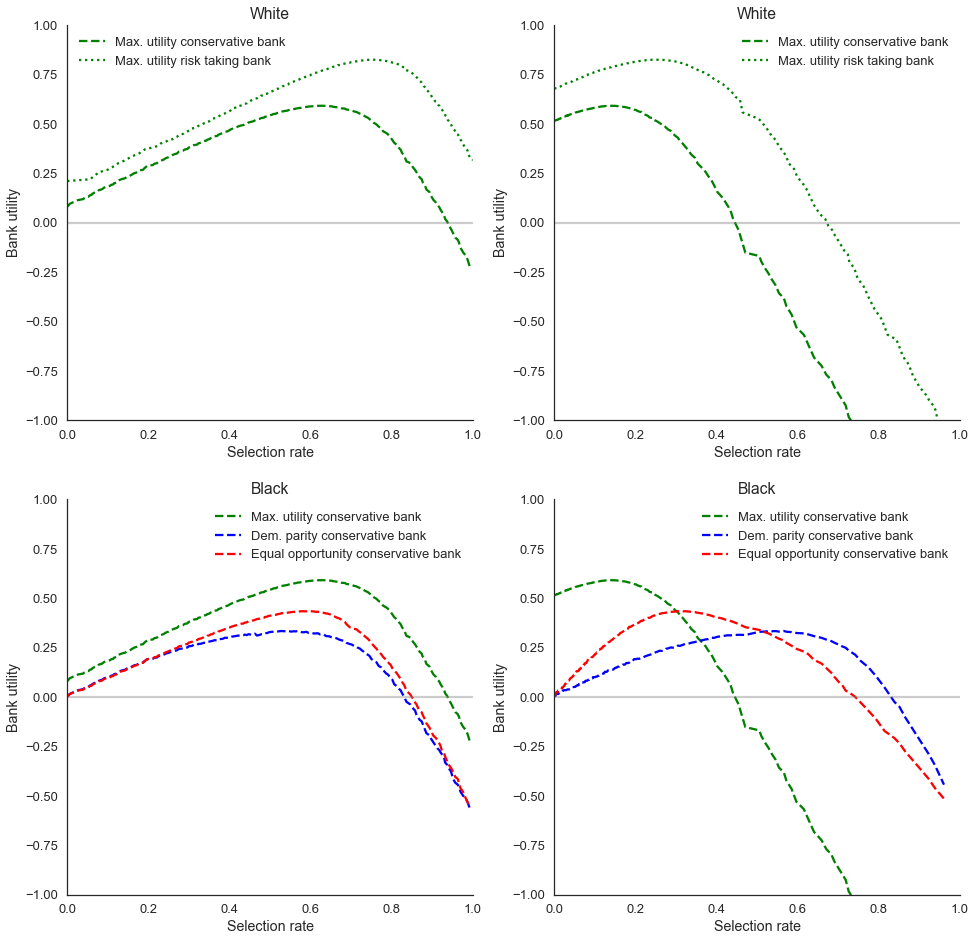

In [25]:
# get bank utility curves
# XY_bank_utility_curves.shape= XxYxZ; X=bank(conservative, risk taking) Y=group(White, Black) Z=values
MP_bank_utility_curves = []; DP_bank_utility_curves = []; EO_bank_utility_curves = []

for i in range(0,N_banks):
    tmp_pis = np.vstack([customer_pis[0][i], customer_pis[1][i]])
    tmp_cdfs = np.vstack([customer_cdfs[0][i], customer_cdfs[1][i]])
    
    tmp_bank_utility_curves = dlo.get_utility_interest_curve_range(loan_repaid_probs, tmp_pis, scores, score_range, bank_interest_rate_ranges[i], utils=util_repay[util_repay_selecter])
    util_MP = np.amax(tmp_bank_utility_curves, axis=1)
    MP_bank_utility_curves.append(np.vstack([tmp_bank_utility_curves[0] + util_MP[1], tmp_bank_utility_curves[1]+ util_MP[0]]))
    DP_bank_utility_curves.append(dlo.get_utility_curves_dempar(tmp_bank_utility_curves,np.vstack(tmp_cdfs),group_size_ratio, scores))
    EO_bank_utility_curves.append(dlo.get_utility_curves_eqopp(tmp_bank_utility_curves,loan_repaid_probs,tmp_pis,group_size_ratio, scores))

# bank_utility_curves.shape= WxXxYxZ; W=policy(MP, DP, EO) X=bank(conservative, risk taking) Y=group(White, Black) Z=values
bank_utility_curves = [MP_bank_utility_curves, DP_bank_utility_curves, EO_bank_utility_curves]
                                  
fig, ax = plt.subplots(2,2,figsize=(16,16)); 

for i in range(0, N_groups):
    for j in range(0, N_banks):
        for k in range(0, N_policy):
            label = policy_names[k] + " " + bank_names[j] + " bank"
            if j !=1:
                ax[1,i].plot(customer_rate_index[i][j], bank_utility_curves[k][j][i], color=policy_colors[k],LineStyle=bank_line_style[j] , label=label)
        label = policy_names[0] + " " + bank_names[j] + " bank"
        ax[0,i].plot(customer_rate_index[i][j], bank_utility_curves[0][j][i], color=policy_colors[0],LineStyle=bank_line_style[j] , label=label)
    
for i in range(2):
    for j in range(N_groups):
        ax[i,j].spines['right'].set_visible(False)
        ax[i,j].spines['top'].set_visible(False)
        ax[i,j].axhline(0,LineStyle='-', color='grey',alpha=0.4)
        ax[i,j].set_title(group_names[i])  
        ax[i,j].set_xlabel('Selection rate')
        ax[i,j].set_ylabel('Bank utility')
        ax[i,j].set_ylim([-1,1])
        ax[i,j].legend()
        ax[i,j].set_xlim([0,1])

 # 2.1 Calculate next step scores

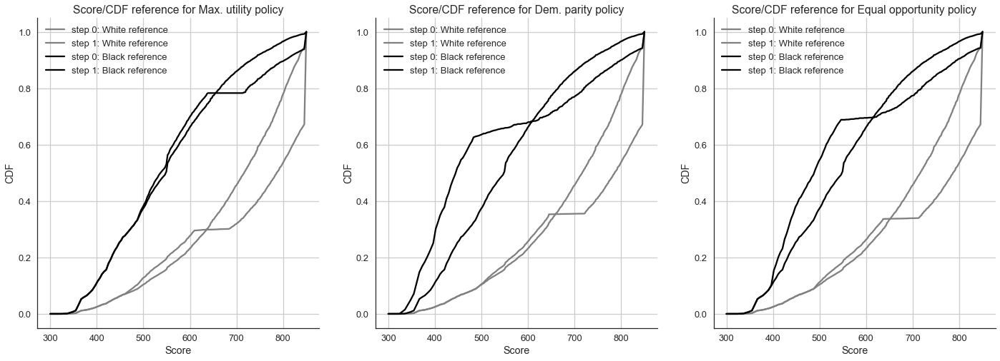

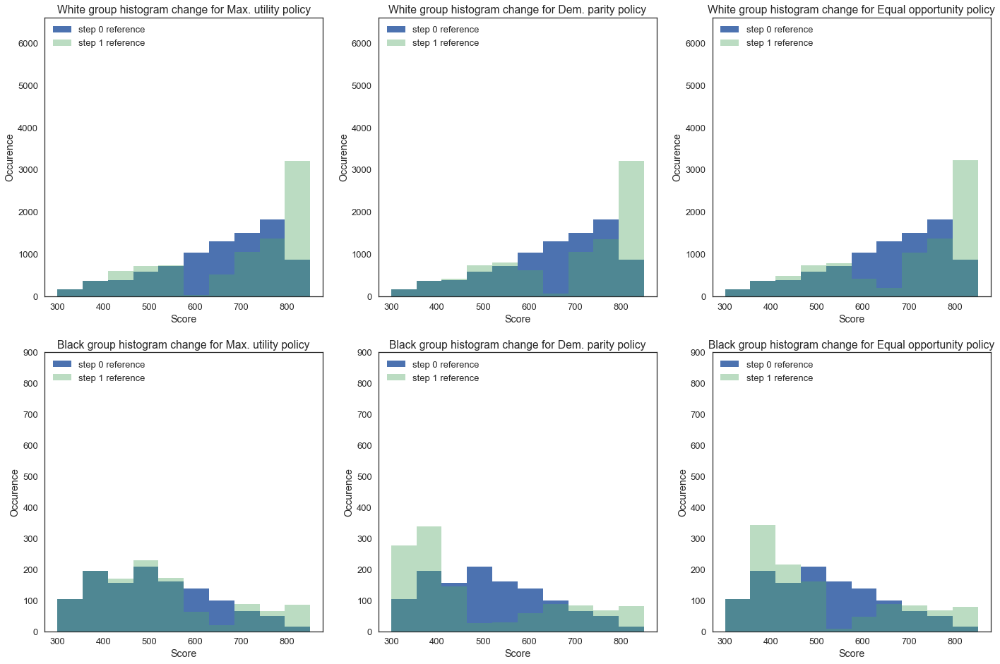

In [26]:
step = 1 
#get extremes for policies
max_rates = []
next_ref_customer_scores=[]
next_customer_scores=[]
next_customer_cdfs=[]
next_customer_pis=[]

#next combined score have the same form WxXxYxZ; W=policy X=group Y=1 Z=values
next_customer_combined_scores = []
next_customer_combined_cdfs = []
next_customer_combined_pis = []

for i in range(N_policy):
    tmp_max_rates = np.zeros([N_groups, N_banks])
    for j in range(0, N_groups):
        for k in range(0, N_banks):
            tmp_max_rates[j][k] = customer_rate_index[j][k][np.argmax(bank_utility_curves[i][k][j])]
    max_rates.append(tmp_max_rates)
    next_ref_customer_scores.append(sf.get_next_ref_customer_scores(ref_customer_scores, score_interest_rates, customer_scores, max_rates[i], loan_repaid_probs, N_groups, N_banks, score_change_repay, score_change_default, score_range))
    next_customer_scores.append(sf.get_customers(next_ref_customer_scores[i], score_shifts, score_range))
    next_customer_cdfs.append(sf.get_customer_cdfs(next_customer_scores[i], scores_list))
    next_customer_pis.append(sf.get_customer_pis(next_customer_cdfs[i]))
    
    next_customer_combined_scores.append(sf.get_combined_scores(next_customer_scores[i], score_interest_rates, N_banks))
    next_customer_combined_cdfs.append(sf.get_customer_cdfs(next_customer_combined_scores[i], scores_list))
    next_customer_combined_pis.append(sf.get_customer_pis(next_customer_combined_cdfs[i]))

fig, ax = plt.subplots(1,N_policy,figsize=(8*N_policy,8))
for i in range(N_policy):
    for j in range(N_groups):
        ax[i].plot(scores_list,customer_cdfs[j][1],color=group_colors[j], label='step 0: '+ group_names[j] + ' ' + reference_bank_name)  
        ax[i].plot(scores_list,next_customer_cdfs[i][j][1],color=group_colors[j], label='step '+ str(step) +': '+ group_names[j] + ' ' + reference_bank_name)  
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)
    ax[i].set_title('Score/CDF reference for ' + policy_names[i] + ' policy')
    ax[i].set_xlabel("Score")
    ax[i].set_ylabel("CDF")
    ax[i].legend()
    ax[i].grid()

fig, ax = plt.subplots(N_groups,N_policy,figsize=(8*N_policy,8*N_groups))
for i in range(N_groups):
    for j in range(N_policy):
        ax[i][j].hist(ref_customer_scores[i], range=score_range,label='step 0 ' + reference_bank_name)
        ax[i][j].hist(next_ref_customer_scores[j][i],alpha=0.4,range=score_range, label='step '+ str(step)+ ' ' + reference_bank_name)
        ax[i][j].set_title(group_names[i] + " group histogram change for " + policy_names[j] + " policy")
        ax[i][j].set_ylabel("Occurence")
        ax[i][j].set_xlabel("Score")
        ax[i][j].set_ylim([0,totals[group_names[i]]*0.75])
        ax[i][j].legend(loc="upper left")
fig.savefig('../plots/step'+ '%03d' % step +'.png')

# 2.2 Get step 1 outcome curves

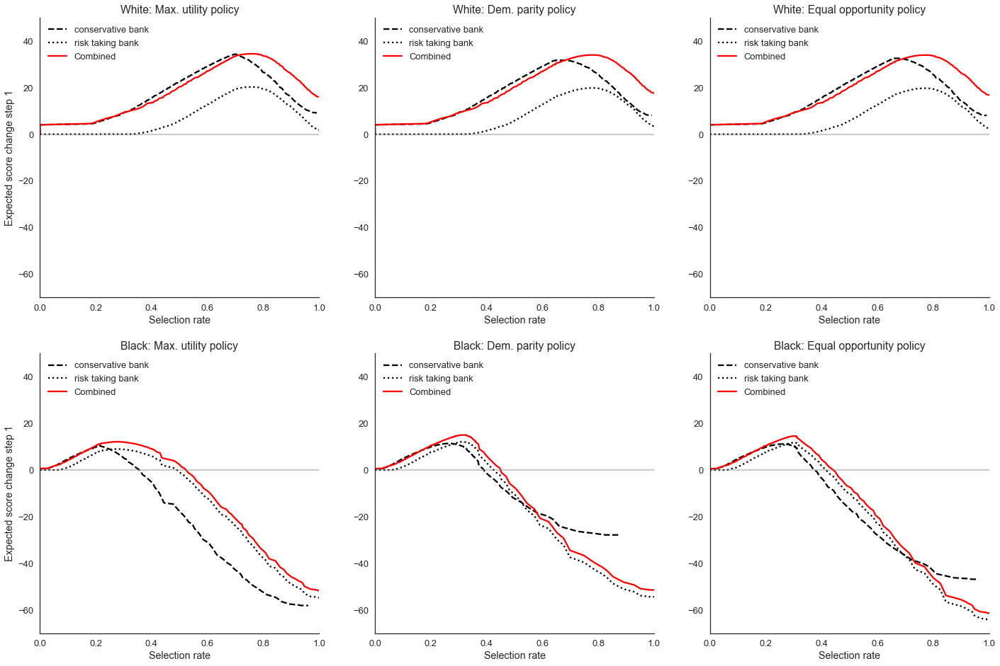

In [ ]:
# get outcome curves
next_customer_outcome_curves = []
next_customer_combined_outcome_curves = []
next_customer_rate_index = []
next_customer_combined_rate_index = []
for k in range(N_policy):
    tmp_next_customer_outcome_curves = []
    tmp_next_customer_combined_outcome_curves = []
    tmp_next_customer_rate_index = []
    tmp_next_customer_combined_rate_index = []
    for i in range(0,N_groups):
        tmp_curves = []
        tmp_rate_index = []
        tmp_next_customer_combined_rate_index.append([list(reversed(1- next_customer_combined_cdfs[k][i][0]))])
        tmp_next_customer_combined_outcome_curves.append([dlo.get_outcome_curve(loan_repaid_probs[i],next_customer_combined_pis[k][i][0],scores,impact)])

        for j in range(0, N_banks):
                tmp_curves.append(dlo.get_outcome_curve(loan_repaid_probs[i],next_customer_pis[k][i][j],scores,impact))
                tmp_rate_index.append(list(reversed(1- next_customer_cdfs[k][i][j])))
        tmp_next_customer_outcome_curves.append(tmp_curves)
        tmp_next_customer_rate_index.append(tmp_rate_index)
        
    next_customer_outcome_curves.append(tmp_next_customer_outcome_curves)
    next_customer_combined_outcome_curves.append(tmp_next_customer_combined_outcome_curves)
    next_customer_rate_index.append(tmp_next_customer_rate_index)
    next_customer_combined_rate_index.append(tmp_next_customer_combined_rate_index)
                                  
fig, ax = plt.subplots(N_groups,N_policy,figsize=(N_policy*8,N_groups*8))                               
for k in range(N_policy):
    for i in range(0,N_groups):
        for j in range(N_banks):
            label = bank_names[j] +" bank"
            ax[i][k].plot(next_customer_rate_index[k][i][j],next_customer_outcome_curves[k][i][j],color='black',LineStyle=bank_line_style[j], label= label)
        ax[i][k].set_title(group_names[i] + ': ' + policy_names[k] + " policy")
        ax[i][k].plot(next_customer_combined_rate_index[k][i][0],next_customer_combined_outcome_curves[k][i][0],color='red',LineStyle="-", label= "Combined")
        ax[i][k].set_xlabel('Selection rate');
        ax[i][k].set_ylim([-70,50])
        ax[i][k].set_xlim([0,1])
        ax[i][k].spines['right'].set_visible(False)
        ax[i][k].spines['top'].set_visible(False)
        ax[i][k].axhline(0,LineStyle='-', color='grey',alpha=0.4)
        ax[i][k].legend(loc="upper left")
        ax[i][0].set_ylabel('Expected score change step '+ str(step))



# 3.1 Compute convergence in X steps

/home/michal/anaconda3/envs/py35/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


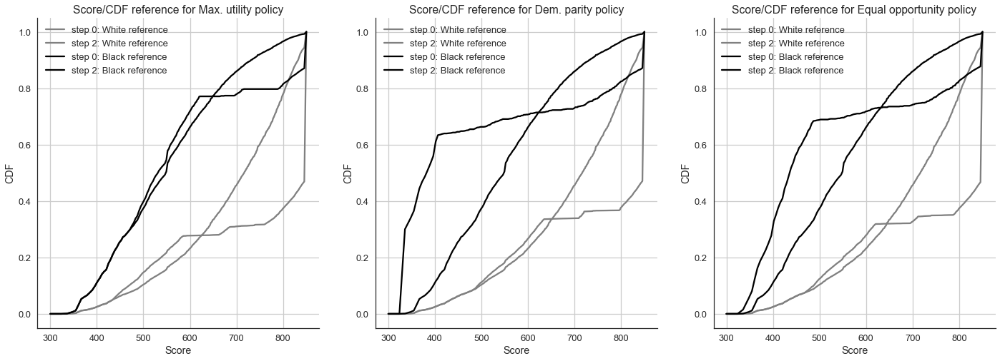

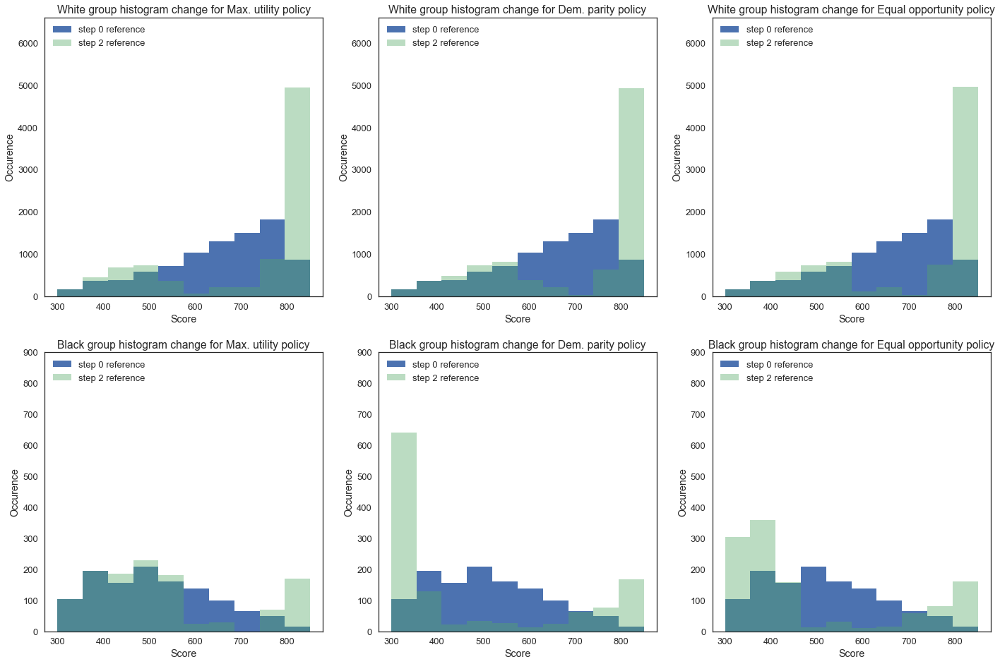

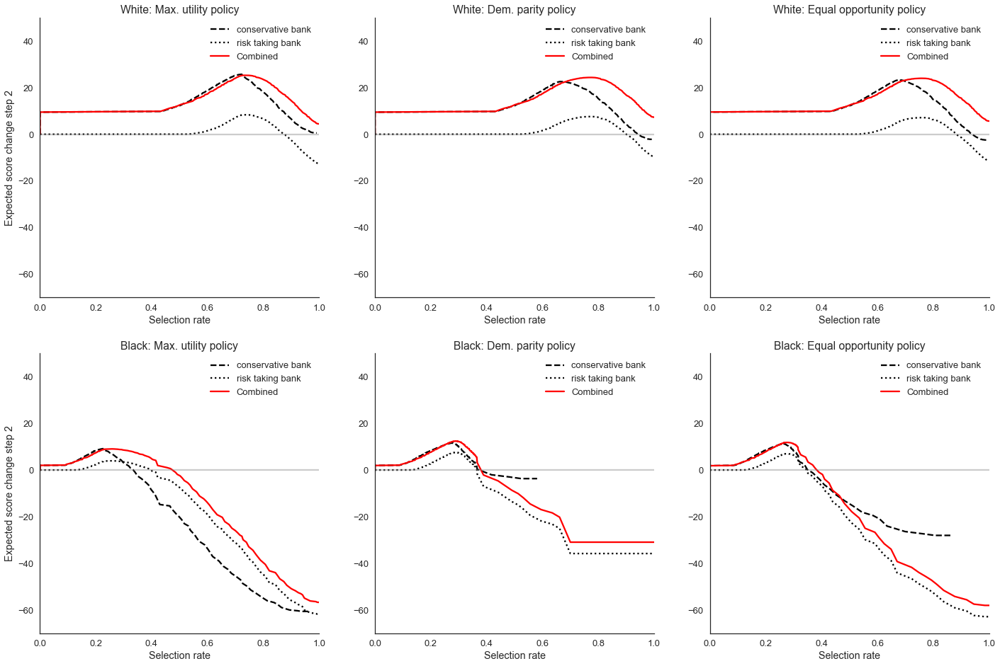

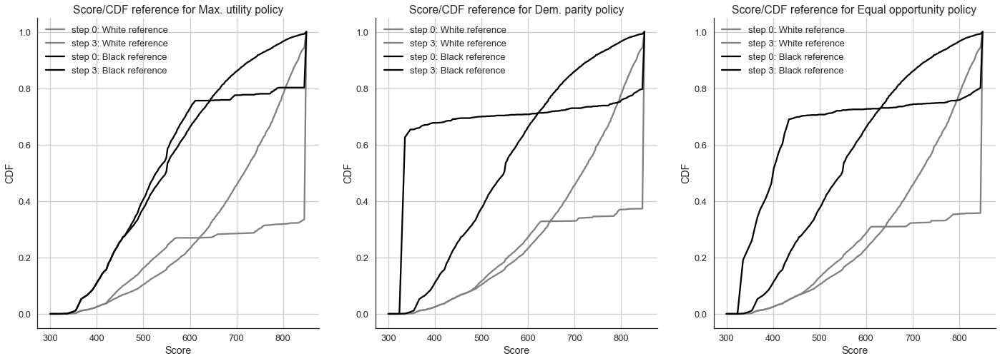

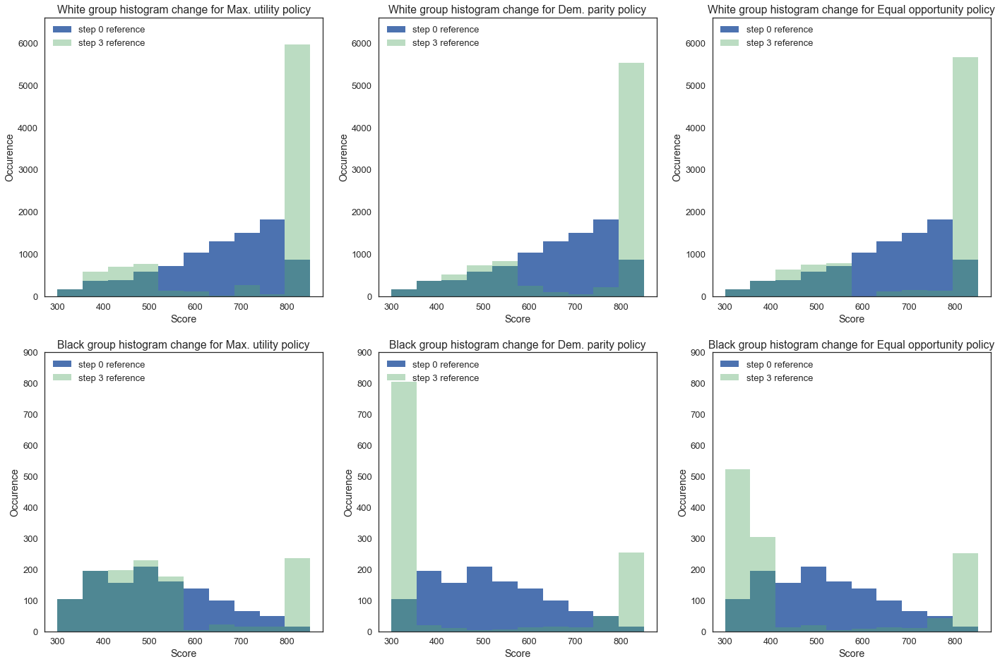

...

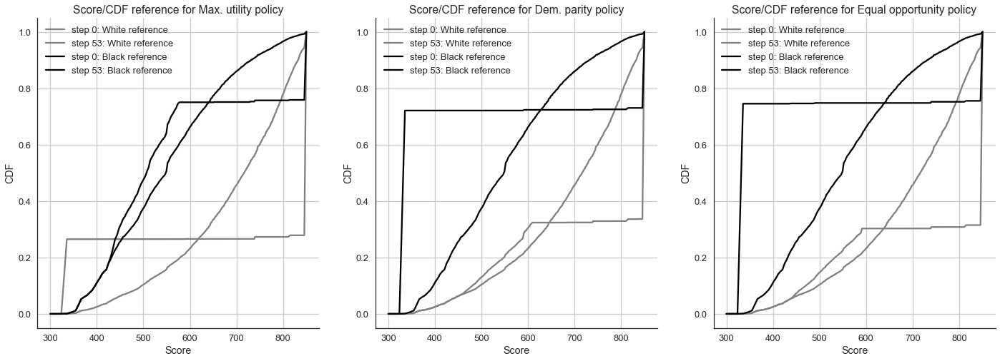

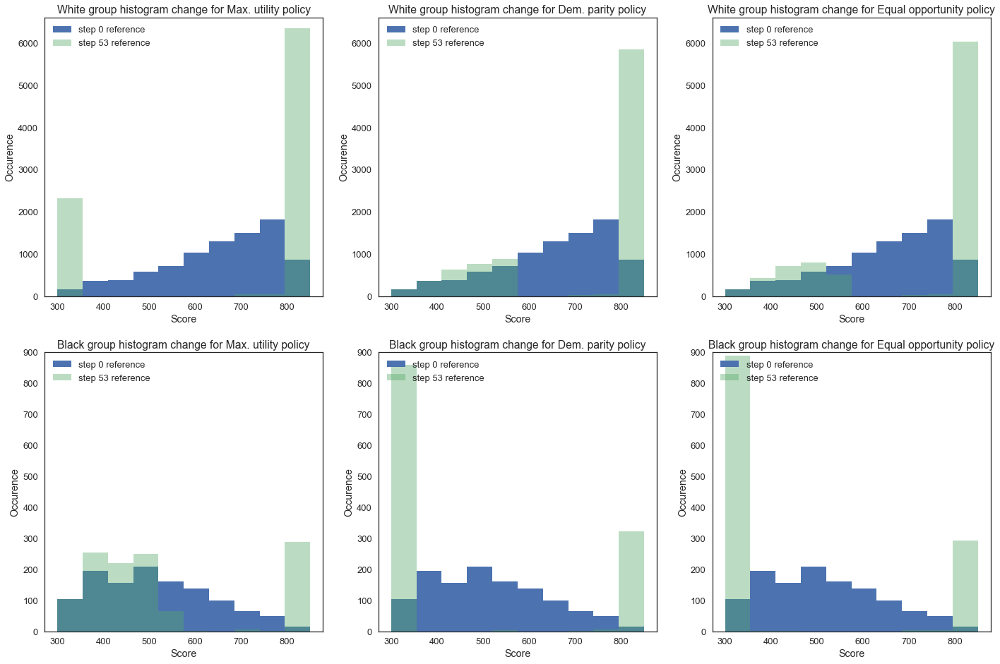

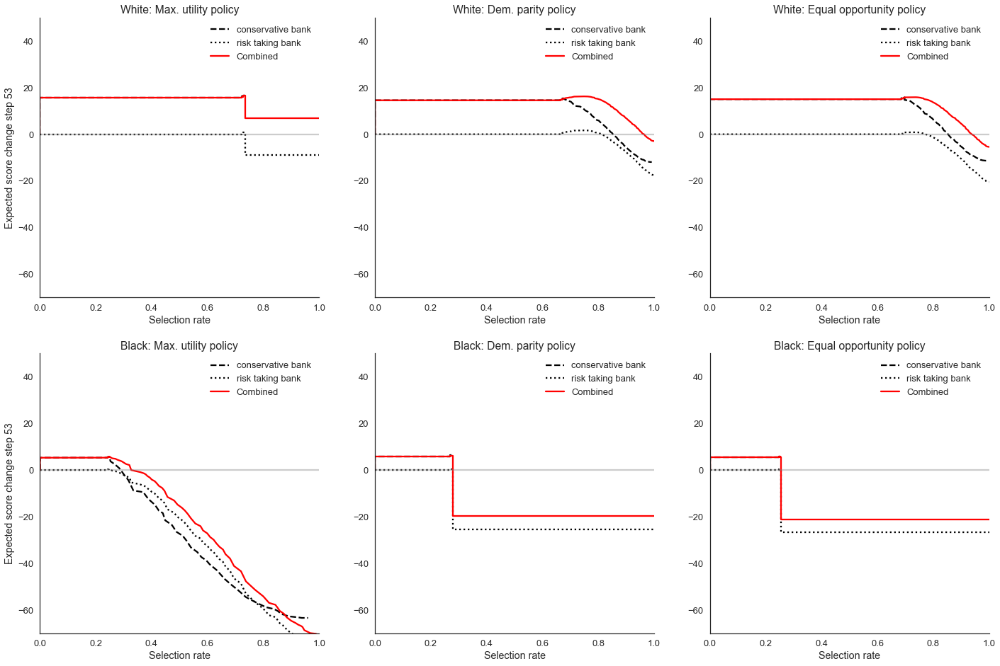

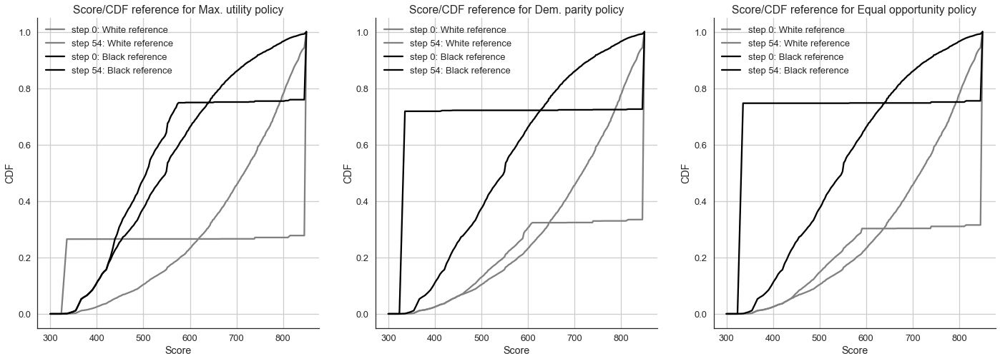

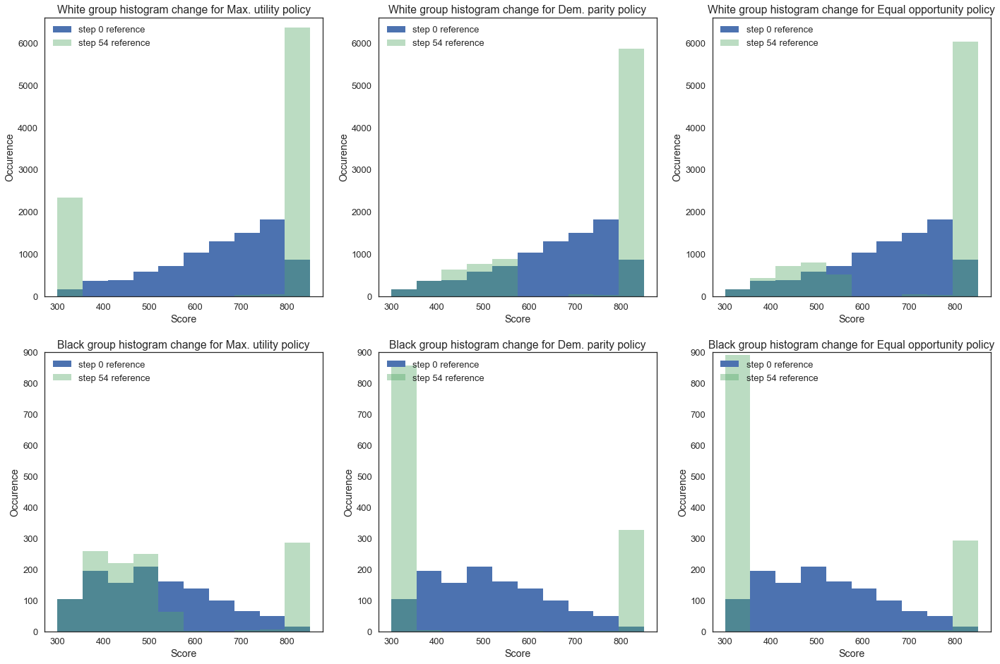

In [ ]:
for step_number in range(step,time_steps):
    step +=1
    #get extremes for policies
    max_rates = []
    next_customer_scores=[]
    next_customer_cdfs=[]
    next_customer_pis=[]

    #next combined score have the same form WxXxYxZ; W=policy X=group Y=1 Z=values
    next_customer_combined_scores = []
    next_customer_combined_cdfs = []
    next_customer_combined_pis = []

    for i in range(N_policy):
        tmp_max_rates = np.zeros([N_groups, N_banks])
        for j in range(0, N_groups):
            for k in range(0, N_banks):
                tmp_max_rates[j][k] = customer_rate_index[j][k][np.argmax(bank_utility_curves[i][k][j])]
        max_rates.append(tmp_max_rates)
        next_ref_customer_scores[i]=sf.get_next_ref_customer_scores(next_ref_customer_scores[i], score_interest_rates, customer_scores, max_rates[i], loan_repaid_probs, N_groups, N_banks, score_change_repay, score_change_default, score_range)
        next_customer_scores.append(sf.get_customers(next_ref_customer_scores[i], score_shifts, score_range))
        next_customer_cdfs.append(sf.get_customer_cdfs(next_customer_scores[i], scores_list))
        next_customer_pis.append(sf.get_customer_pis(next_customer_cdfs[i]))

        next_customer_combined_scores.append(sf.get_combined_scores(next_customer_scores[i], score_interest_rates, N_banks))
        next_customer_combined_cdfs.append(sf.get_customer_cdfs(next_customer_combined_scores[i], scores_list))
        next_customer_combined_pis.append(sf.get_customer_pis(next_customer_combined_cdfs[i]))

    fig, ax = plt.subplots(1,N_policy,figsize=(8*N_policy,8))
    for i in range(N_policy):
        for j in range(N_groups):
            ax[i].plot(scores_list,customer_cdfs[j][1],color=group_colors[j], label='step 0: '+ group_names[j] + ' ' + reference_bank_name)  
            ax[i].plot(scores_list,next_customer_cdfs[i][j][1],color=group_colors[j], label='step '+ str(step) + ': '+ group_names[j] + ' ' + reference_bank_name)  
        ax[i].spines['right'].set_visible(False)
        ax[i].spines['top'].set_visible(False)
        ax[i].set_title('Score/CDF reference for ' + policy_names[i] + ' policy')
        ax[i].set_xlabel("Score")
        ax[i].set_ylabel("CDF")
        ax[i].legend()
        ax[i].grid()

    fig, ax = plt.subplots(N_groups,N_policy,figsize=(8*N_policy,8*N_groups))
    for i in range(N_groups):
        for j in range(N_policy):
            ax[i][j].hist(ref_customer_scores[i], range=score_range,label='step 0 ' + reference_bank_name)
            ax[i][j].hist(next_ref_customer_scores[j][i],alpha=0.4,range=score_range, label='step '+ str(step) + ' ' + reference_bank_name)
            ax[i][j].set_title(group_names[i] + " group histogram change for " + policy_names[j] + " policy")
            ax[i][j].set_ylabel("Occurence")
            ax[i][j].set_xlabel("Score")
            ax[i][j].set_ylim([0,totals[group_names[i]]*0.75])
            ax[i][j].legend(loc="upper left")
    fig.savefig('../plots/step'+ '%03d' % step +'.png')
            
    # get outcome curves
    next_customer_outcome_curves = []
    next_customer_combined_outcome_curves = []
    next_customer_rate_index = []
    next_customer_combined_rate_index = []
    for k in range(N_policy):
        tmp_next_customer_outcome_curves = []
        tmp_next_customer_combined_outcome_curves = []
        tmp_next_customer_rate_index = []
        tmp_next_customer_combined_rate_index = []
        for i in range(0,N_groups):
            tmp_curves = []
            tmp_rate_index = []
            tmp_next_customer_combined_rate_index.append([list(reversed(1- next_customer_combined_cdfs[k][i][0]))])
            tmp_next_customer_combined_outcome_curves.append([dlo.get_outcome_curve(loan_repaid_probs[i],next_customer_combined_pis[k][i][0],scores,impact)])

            for j in range(0, N_banks):
                    tmp_curves.append(dlo.get_outcome_curve(loan_repaid_probs[i],next_customer_pis[k][i][j],scores,impact))
                    tmp_rate_index.append(list(reversed(1- next_customer_cdfs[k][i][j])))
            tmp_next_customer_outcome_curves.append(tmp_curves)
            tmp_next_customer_rate_index.append(tmp_rate_index)

        next_customer_outcome_curves.append(tmp_next_customer_outcome_curves)
        next_customer_combined_outcome_curves.append(tmp_next_customer_combined_outcome_curves)
        next_customer_rate_index.append(tmp_next_customer_rate_index)
        next_customer_combined_rate_index.append(tmp_next_customer_combined_rate_index)

    fig, ax = plt.subplots(N_groups,N_policy,figsize=(N_policy*8,N_groups*8))                               
    for k in range(N_policy):
        for i in range(0,N_groups):
            for j in range(N_banks):
                label = bank_names[j] +" bank"
                ax[i][k].plot(next_customer_rate_index[k][i][j],next_customer_outcome_curves[k][i][j],color='black',LineStyle=bank_line_style[j], label= label)
            ax[i][k].set_title(group_names[i] + ': ' + policy_names[k] + " policy")
            ax[i][k].plot(next_customer_combined_rate_index[k][i][0],next_customer_combined_outcome_curves[k][i][0],color='red',LineStyle="-", label= "Combined")
            ax[i][k].set_xlabel('Selection rate');
            ax[i][k].set_ylim([-70,50])
            ax[i][k].set_xlim([0,1])
            ax[i][k].spines['right'].set_visible(False)
            ax[i][k].spines['top'].set_visible(False)
            ax[i][k].axhline(0,LineStyle='-', color='grey',alpha=0.4)
            ax[i][k].legend()
            ax[i][0].set_ylabel('Expected score change step ' + str(step))
